In [1]:
import gc
import time
from typing import List

import numpy as np
import pandas as pd
from scipy import stats

import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.animation as animation
from IPython.display import HTML, display

from sklearn.datasets import fetch_covtype
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report, log_loss
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, MinMaxScaler

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch import Tensor
from torch.optim import Optimizer
from torch.autograd import Function
import torch.utils.benchmark as benchmark
import torch._dynamo
import torch._inductor.metrics as metrics

from torchinfo import summary

In [2]:
device = 'cuda' if torch.cuda.is_available() else ('mps' if torch.backends.mps.is_available() else 'cpu')
DEVICE = device

In [3]:
df = sns.load_dataset('diamonds')
df = df[['carat', 'depth', 'table', 'price', 'x', 'y', 'z', 'cut']]

X = df.drop(['carat', 'depth', 'table', 'price', 'y', 'z', 'cut'], axis=1)
y = df['price']

x_scaler = MinMaxScaler(feature_range=(-1, 1))
X_scaled = x_scaler.fit_transform(X)

y_scaler = MinMaxScaler(feature_range=(-5, 5))
y = y_scaler.fit_transform(y.to_numpy().reshape(-1, 1))

X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

X_train_tensor = torch.tensor(X_train, dtype=torch.float32).to(device)
y_train_tensor = torch.tensor(y_train, dtype=torch.float32).to(device).view(-1, 1)
X_test_tensor = torch.tensor(X_test, dtype=torch.float32).to(device)
y_test_tensor = torch.tensor(y_test, dtype=torch.float32).to(device).view(-1, 1)

print(X.shape)
print(y.shape)

print(f"X_train_tensor shape: {X_train_tensor.shape}")
print(f"y_train_tensor shape: {y_train_tensor.shape}")
print(f"X_test_tensor shape: {X_test_tensor.shape}")
print(f"y_test_tensor shape: {y_test_tensor.shape}")

(53940, 1)
(53940, 1)
X_train_tensor shape: torch.Size([43152, 1])
y_train_tensor shape: torch.Size([43152, 1])
X_test_tensor shape: torch.Size([10788, 1])
y_test_tensor shape: torch.Size([10788, 1])


In [4]:
def train(
    model,
    criterion,
    optimizers: List[torch.optim.Optimizer],
    epochs: int,
    *,
    plot_every: int = 50,
    anim_interval_ms: int = 500,
    warmup_epochs = 100
):
    print(summary(model, input_data=X_train_tensor))
    
    plt.rcParams['animation.embed_limit'] = 50

    torch.set_printoptions(threshold=float("inf"))

    best_test_loss = float("inf")
    train_losses: list[float] = []
    test_losses: list[float] = []
    learning_rates: list[float] = []

    if torch.cuda.is_available():
        torch.cuda.empty_cache()
        torch.cuda.reset_peak_memory_stats()
        torch.cuda.synchronize()

    schedulers = [
        torch.optim.lr_scheduler.ReduceLROnPlateau(
            opt, factor=0.99999, patience=0, threshold=0, eps=0
        )
        for opt in optimizers
    ]

    frames: list[np.ndarray] = []

    for epoch in range(1, epochs + 1):
        if epoch <= warmup_epochs:
            warmup_scale = epoch / warmup_epochs
            for opt in optimizers:
                for group in opt.param_groups:
                    group["lr"] = group.get("base_lr", group["lr"]) * warmup_scale

        model.train()
        for opt in optimizers:
            opt.zero_grad()

        train_outputs = model(X_train_tensor)

        train_loss = criterion(train_outputs, y_train_tensor)
        train_loss.backward()
        
        model.eval()
        with torch.no_grad():
            test_outputs = model(X_test_tensor)
            test_loss = criterion(test_outputs, y_test_tensor)
            test_predictions = torch.argmax(test_outputs, dim=1)
            test_accuracy = (
                (test_predictions == y_test_tensor).sum().item() / y_test_tensor.size(0)
            )

        for opt in optimizers:
            opt.step()

        train_losses.append(train_loss.item())
        test_losses.append(test_loss.item())
        learning_rates.append(schedulers[0].optimizer.param_groups[0]["lr"])

        if test_loss.item() < best_test_loss:
            best_test_loss = test_loss.item()

        if epoch > warmup_epochs:
            for sched in schedulers:
                sched.step(train_loss.item())

        if epoch % 50 == 0:
            print(
                f"Epoch {epoch}/{epochs}, "
                f"Train Loss: {train_loss.item():.6f}, "
                f"Test Loss: {test_loss.item():.6f}, "
                f"Test Acc: {test_accuracy:.4f}, "
                f"LR: {schedulers[0].optimizer.param_groups[0]['lr']:.4e}"
            )

        if epoch % plot_every == 0 or epoch == epochs:
            fig, axes = plt.subplots(3, 1, figsize=(12, 18), constrained_layout=True)

            axes[0].plot(train_losses, label="Train Loss")
            axes[0].plot(test_losses, label="Test Loss")
            axes[0].set_title("Loss vs. Epoch")
            axes[0].set_xlabel("Epoch")
            axes[0].set_ylabel("Cross-entropy loss")
            axes[0].grid(True)
            axes[0].legend()

            axes[1].plot(learning_rates, label="LR", color="green")
            axes[1].set_title("Learning-rate trajectory")
            axes[1].set_xlabel("Epoch")
            axes[1].set_ylabel("Learning rate")
            axes[1].grid(True)
            axes[1].legend()

            model.eval()
            X_plot = torch.linspace(-1, 1, 20000).reshape(-1, 1).to(device)
            with torch.no_grad():
                model_output = model(X_plot)

            axes[2].plot(
                X_train_tensor.cpu().numpy(), y_train_tensor.cpu().numpy(), "b.", label="y_train"
            )
            axes[2].plot(
                X_plot.cpu().numpy(), model_output.detach().cpu().numpy(), "r.", label="model(X)"
            )
            axes[2].set_title("Model output vs. target")
            axes[2].set_xlabel("X")
            axes[2].grid(True)
            axes[2].legend()

            fig.canvas.draw()
            width, height = fig.canvas.get_width_height()
            buf = np.frombuffer(fig.canvas.buffer_rgba(), dtype=np.uint8).reshape(height, width, 4) # type: ignore
            frame = buf[:, :, :3].copy()
            frames.append(frame)
            plt.close(fig)

    if torch.cuda.is_available():
        gc.collect()
        torch.cuda.empty_cache()
        torch.cuda.synchronize()
        print(
            f"[GPU] Peak memory allocated: "
            f"{torch.cuda.max_memory_allocated() / 1024 ** 2:.2f} MB"
        )
        print(
            f"[GPU] Peak memory reserved: "
            f"{torch.cuda.max_memory_reserved() / 1024 ** 2:.2f} MB"
        )

    if frames:
        fig_anim = plt.figure(figsize=(8, 6))
        im = plt.imshow(frames[0])
        plt.axis("off")

        def _animate(i):
            im.set_data(frames[i])
            return [im]

        ani = animation.FuncAnimation(
            fig_anim,
            _animate,
            frames=len(frames),
            interval=anim_interval_ms,
            blit=True,
        )
        display(HTML(ani.to_jshtml()))

    print("Best test loss:", best_test_loss)

In [5]:
def benchmark(model, x, y, optimizer, loss_fn, iterations, device):
    forward_times = []
    backward_times = []

    for _ in range(5):
        optimizer.zero_grad()
        output = model(x)
        loss = loss_fn(output, y)
        loss.backward()
        optimizer.step()

    if device == 'cuda':
        torch.cuda.synchronize()

    for i in range(iterations):
        optimizer.zero_grad()

        start_time = time.perf_counter()
        output = model(x)
        if device == 'cuda':
            torch.cuda.synchronize()
        end_time = time.perf_counter()
        forward_times.append(end_time - start_time)

        loss = loss_fn(output, y)

        start_time = time.perf_counter()
        loss.backward()
        if device == 'cuda':
            torch.cuda.synchronize()
        end_time = time.perf_counter()
        backward_times.append(end_time - start_time)

        optimizer.step()

    avg_forward = sum(forward_times) / iterations * 1000
    avg_backward = sum(backward_times) / iterations * 1000

    print("-" * 50)
    print(f"Benchmarking Results on '{device.upper()}'")
    print(f"Iterations: {iterations}")
    print(f"Average Forward Pass Time:  {avg_forward:.4f} ms")
    print(f"Average Backward Pass Time: {avg_backward:.4f} ms")
    print("-" * 50)

In [6]:
class CustomActivationEfficient(nn.Module):
    def __init__(self, num_features, num_control_points=1000, eps=1e-6):
        super(CustomActivationEfficient, self).__init__()
        self.register_buffer("mins", None)
        self.register_buffer("maxs", None)

        self.eps = eps
        self.num_control_points = num_control_points

        self.r_weight = nn.Parameter(torch.zeros(num_features, num_control_points))  # (num_features, num_control_points)
        self.l_weight = nn.Parameter(torch.zeros(num_features, num_control_points))  # (num_features, num_control_points)

        self.register_buffer("local_bias", torch.arange(num_control_points))  # (num_control_points,)
        self.register_buffer("feature_offset", torch.arange(num_features).view(1, -1) * self.num_control_points)  # (1, num_features)

    def forward(self, x):
        # x: (batch_size, num_features)

        if self.training or self.mins is None or self.maxs is None:
            self.mins = x.amin(dim=0, keepdim=True)  # (1, num_features)
            self.maxs = x.amax(dim=0, keepdim=True)  # (1, num_features)

        x = (x - self.mins) / (self.maxs - self.mins + self.eps) * (self.num_control_points - 1)  # (batch_size, num_features)

        # TODO: may change to feature-major order (num_features, batch_size) since that may help with memory access patterns (improved locality)
        
        lower_indices_float = x.floor().clamp(0, self.num_control_points - 2)  # (batch_size, num_features)
        lower_indices = lower_indices_float.long() + self.feature_offset  # (batch_size, num_features)

        indices = torch.stack((lower_indices, lower_indices + 1), dim=-1)  # (batch_size, num_features, 2)
        vals = F.embedding(indices, self.get_interp_tensor())  # (batch_size, num_features, 2, 1)

        lower_val, upper_val = vals.squeeze(-1).unbind(-1)  # each: (batch_size, num_features)
        return torch.lerp(lower_val, upper_val, x - lower_indices_float)  # (batch_size, num_features)
    
    def get_interp_tensor(self):
        cs_r_weight = torch.cumsum(self.r_weight, dim=1)  # (num_features, num_control_points)
        cs_l_weight = torch.cumsum(self.l_weight, dim=1)  # (num_features, num_control_points)

        cs_r_weight_bias_prod = torch.cumsum(self.r_weight * self.local_bias, dim=1)  # type: ignore (num_features, num_control_points)
        cs_l_weight_bias_prod = torch.cumsum(self.l_weight * self.local_bias, dim=1)  # type: ignore (num_features, num_control_points)

        r_interp = (self.local_bias * cs_r_weight - cs_r_weight_bias_prod)  # type: ignore (num_features, num_control_points)
        l_interp = (cs_l_weight_bias_prod[..., -1:] - cs_l_weight_bias_prod) - self.local_bias * (cs_l_weight[..., -1:] - cs_l_weight)  # type: ignore (num_features, num_control_points)
        return (r_interp + l_interp).view(-1, 1)  # (num_features * num_control_points, 1)

In [7]:
class CustomActivationNaive(nn.Module):
    def __init__(self, num_features, num_control_points=1000, eps=1e-6):
        super(CustomActivationNaive, self).__init__()
        self.register_buffer("mins", None)
        self.register_buffer("maxs", None)

        self.eps = eps
        self.num_control_points = num_control_points

        self.register_buffer("local_bias", torch.arange(num_control_points))  # (num_control_points,)

        self.pos_weight = nn.Parameter(torch.zeros(num_features, num_control_points))
        self.neg_weight = nn.Parameter(torch.zeros(num_features, num_control_points))

    def forward(self, x):
        if self.training or self.mins is None or self.maxs is None:
            self.mins = x.amin(dim=0, keepdim=True)  # (1, num_features)
            self.maxs = x.amax(dim=0, keepdim=True)  # (1, num_features)

        x = (x - self.mins) / (self.maxs - self.mins + self.eps) * (self.num_control_points - 1)  # (batch_size, num_features)

        x_shifted = x.unsqueeze(-1) - self.local_bias
        return (F.relu(x_shifted) * self.pos_weight).sum(dim=-1) + (F.relu(-x_shifted) * self.neg_weight).sum(dim=-1)

In [8]:
model = torch.compile(CustomActivationEfficient(num_features=1, num_control_points=1000)).to(DEVICE) # type: ignore

criterion = nn.MSELoss()

common_factor = 1e-2
optimizers = [optim.AdamW(model.parameters(), lr=0.001 * common_factor, weight_decay=0.0)] # type: ignore

for opt in optimizers:
    for g in opt.param_groups:
        g.setdefault("base_lr", g["lr"])

model(X_train_tensor)
print()

Layer (type:depth-idx)                   Output Shape              Param #
OptimizedModule                          [43152, 1]                --
├─CustomActivationEfficient: 1-1         [43152, 1]                2,000
Total params: 2,000
Trainable params: 2,000
Non-trainable params: 0
Total mult-adds (Units.MEGABYTES): 86.30
Input size (MB): 0.17
Forward/backward pass size (MB): 0.35
Params size (MB): 0.01
Estimated Total Size (MB): 0.53
Epoch 50/1000, Train Loss: 1.087135, Test Loss: 1.092587, Test Acc: 0.0000, LR: 5.0000e-06
Epoch 100/1000, Train Loss: 0.633381, Test Loss: 0.619272, Test Acc: 0.0000, LR: 1.0000e-05
Epoch 150/1000, Train Loss: 0.613706, Test Loss: 0.601636, Test Acc: 0.0000, LR: 1.0000e-05
Epoch 200/1000, Train Loss: 0.609859, Test Loss: 0.599685, Test Acc: 0.0000, LR: 1.0000e-05
Epoch 250/1000, Train Loss: 0.608419, Test Loss: 0.598864, Test Acc: 0.0000, LR: 1.0000e-05
Epoch 300/1000, Train Loss: 0.607715, Test Loss: 0.598403, Test Acc: 0.0000, LR: 1.0000e-05
Epoch 3

Best test loss: 0.5961693525314331


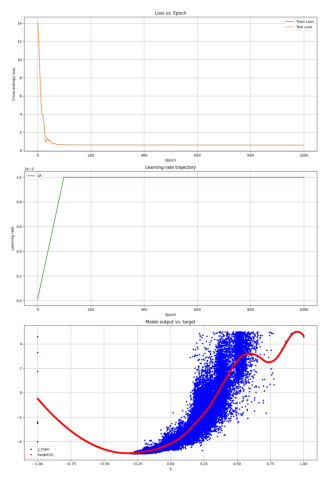

In [9]:
train(model, criterion, optimizers, epochs=1000, warmup_epochs=100, plot_every=10) # type: ignore

In [10]:
model = torch.compile(CustomActivationNaive(num_features=1, num_control_points=1000,)).to(DEVICE) # type: ignore

criterion = nn.MSELoss()

common_factor = 1e-2
optimizers = [optim.AdamW(model.parameters(), lr=0.001 * common_factor, weight_decay=0.0)] # type: ignore

for opt in optimizers:
    for g in opt.param_groups:
        g.setdefault("base_lr", g["lr"])

model(X_train_tensor)
print()

Layer (type:depth-idx)                   Output Shape              Param #
OptimizedModule                          [43152, 1]                --
├─CustomActivationNaive: 1-1             [43152, 1]                2,000
Total params: 2,000
Trainable params: 2,000
Non-trainable params: 0
Total mult-adds (Units.MEGABYTES): 86.30
Input size (MB): 0.17
Forward/backward pass size (MB): 0.35
Params size (MB): 0.01
Estimated Total Size (MB): 0.53
Epoch 50/1000, Train Loss: 1.087137, Test Loss: 1.092589, Test Acc: 0.0000, LR: 5.0000e-06
Epoch 100/1000, Train Loss: 0.633380, Test Loss: 0.619272, Test Acc: 0.0000, LR: 1.0000e-05
Epoch 150/1000, Train Loss: 0.613706, Test Loss: 0.601636, Test Acc: 0.0000, LR: 1.0000e-05
Epoch 200/1000, Train Loss: 0.609859, Test Loss: 0.599685, Test Acc: 0.0000, LR: 1.0000e-05
Epoch 250/1000, Train Loss: 0.608419, Test Loss: 0.598864, Test Acc: 0.0000, LR: 1.0000e-05
Epoch 300/1000, Train Loss: 0.607715, Test Loss: 0.598403, Test Acc: 0.0000, LR: 1.0000e-05
Epoch 3

Best test loss: 0.5961694121360779


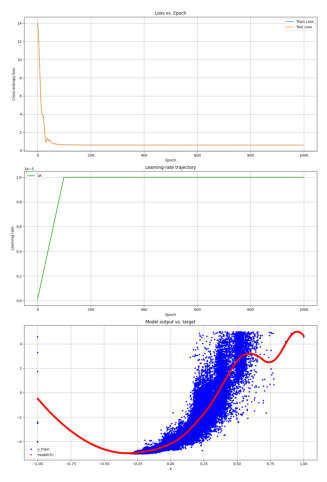

In [11]:
train(model, criterion, optimizers, epochs=1000, warmup_epochs=100, plot_every=10) # type: ignore

In [12]:
BATCH_SIZE = 1000
NUM_FEATURES = 100
NUM_CONTROL_POINTS = 1000
ITERATIONS = 100
LEARNING_RATE = 1e-3

x_input = torch.randn(BATCH_SIZE, NUM_FEATURES).to(DEVICE)
y_target = torch.randn(BATCH_SIZE, NUM_FEATURES).to(DEVICE)

In [13]:
model = torch.compile(CustomActivationEfficient(num_features=NUM_FEATURES, num_control_points=NUM_CONTROL_POINTS).to(DEVICE))
model.train()

loss_function = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=LEARNING_RATE)

model(x_input)
benchmark(model, x_input, y_target, optimizer, loss_function, ITERATIONS, DEVICE)

--------------------------------------------------
Benchmarking Results on 'CUDA'
Iterations: 100
Average Forward Pass Time:  0.3851 ms
Average Backward Pass Time: 0.5007 ms
--------------------------------------------------


In [14]:
model = torch.compile(CustomActivationNaive(num_features=NUM_FEATURES, num_control_points=NUM_CONTROL_POINTS).to(DEVICE))
model.train()

loss_function = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=LEARNING_RATE)

model(x_input)
benchmark(model, x_input, y_target, optimizer, loss_function, ITERATIONS, DEVICE)

--------------------------------------------------
Benchmarking Results on 'CUDA'
Iterations: 100
Average Forward Pass Time:  2.0544 ms
Average Backward Pass Time: 0.9009 ms
--------------------------------------------------
